In [65]:
import pandas as pd
import torch
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import seaborn as sns
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score
import umap
from sklearn.manifold import TSNE
import plotly.express as px
import plotly.io as pio
pio.renderers.default = 'notebook'  # or 'notebook_connected', or 'iframe'

In [18]:
# load env (which includes classification)
env_data_path = '../data/from-hari-v2/clean_combined_campaign_env_data.csv'
df_env = pd.read_csv(env_data_path)
df_env.shape

(524033, 48)

In [19]:
# load backbone features
emb_path = '../data/from-hari-v2/clean_combined_campaign_features.pth'
emb = torch.load(emb_path)
df_emb = pd.DataFrame(emb.numpy())
df_emb.shape

(524033, 384)

In [5]:
# merge df's 
df_merged = df_emb.merge(df_env, left_index=True, right_index=True)
df_merged.shape
# save 
save_dir = '/home/jko/ssl-cpi-analysis/data'
save_filename = 'cls_env_all_merged.parquet'
save_path = os.path.join(save_dir, save_filename)
df_merged.to_parquet(save_path, index=False)

In [20]:
# reload data to confirm
save_dir = '/home/jko/ssl-cpi-analysis/data'
save_filename = 'cls_env_all_merged.parquet'
save_path = os.path.join(save_dir, save_filename)
df_reload = pd.read_parquet(save_path)
df_merged = df_reload
df_merged.shape

(524033, 432)

In [23]:
# df_subset = df_merged.sample(1000)
# emb_cols = list(range(384))
# X = df_subset[emb_cols]
# X_scaled = StandardScaler().fit_transform(X)

In [22]:
# # cluster on subset of embeddings
# k = 5  # usually set to min_samples
# nbrs = NearestNeighbors(n_neighbors=k).fit(X_scaled)
# distances, indices = nbrs.kneighbors(X_scaled)
# k_distances = np.sort(distances[:, k-1])

# plt.plot(k_distances)
# plt.xlabel('Points sorted by distance')
# plt.ylabel(f'{k}th nearest neighbor distance')
# plt.title('k-distance Graph for DBSCAN eps')
# plt.show()

In [24]:
# eps_values = list(range(15,21))
# fig, axes = plt.subplots(2, 3, figsize=(12, 8), sharex=True, sharey=True)
# axes = axes.flatten()

# for i, eps in enumerate(eps_values):
#     clustering = DBSCAN(eps=eps, min_samples=5)
#     labels = clustering.fit_predict(X_scaled)
#     ax = axes[i]
#     scatter = ax.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels, cmap='tab10', s=5)
#     ax.set_title(f'eps={eps}')
#     ax.set_xlabel('UMAP 1')
#     ax.set_ylabel('UMAP 2')

# # Hide any unused subplots if eps_values < 6
# for j in range(len(eps_values), len(axes)):
#     axes[j].axis('off')

# plt.tight_layout()
# plt.show()

In [32]:
labels.unique()

array(['rimed', 'column', 'compact_irreg', 'agg', 'planar_polycrystal',
       'bullet', 'budding'], dtype=object)

In [25]:
# make sure all colnames are strings 
df_merged.columns = df_merged.columns.astype(str)

In [75]:
# get a balanced subset
samples_per_class = 1000
dfs = []
# habit_classes = ['compact_irreg', 'bullet', 'planar_polycrystal', 'agg', 'budding', 'column', 'rimed']
habit_classes = ['compact_irreg', 'planar_polycrystal']
for cls in habit_classes:
    df_cls = df_merged[df_merged['Classification'] == cls].sample(n=samples_per_class, random_state=42)
    dfs.append(df_cls)
df_balanced = pd.concat(dfs).reset_index(drop=True)

In [76]:
# plot N from each class=
emb_cols = [str(i) for i in range(384)]
X = df_balanced[emb_cols]
X_scaled = StandardScaler().fit_transform(X)
# X_scaled = MinMaxScaler().fit_transform(X)
n_components = 2

# UMAP
umap_model = umap.UMAP(n_components=n_components, random_state=42)
X_umap = umap_model.fit_transform(X_scaled)
# X_umap = umap_model.fit_transform(X)

# Map string labels to integers
labels = df_balanced['Classification']
classes = labels.unique()
class_to_int = {cls: i for i, cls in enumerate(classes)}
labels_int = labels.map(class_to_int)

/home/jko/miniconda3/envs/torch/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



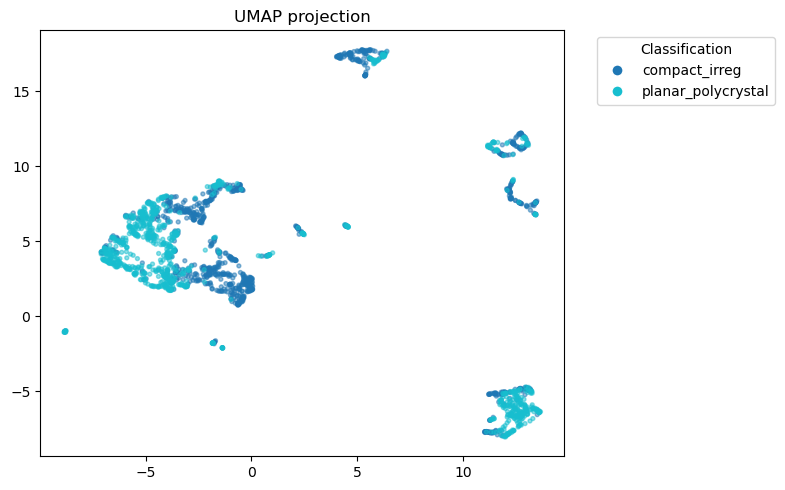

In [77]:
# Plotting
fig, ax = plt.subplots(figsize=(8, 5))
scatter = ax.scatter(X_umap[:, 0], X_umap[:, 1], s=8, alpha=0.5, c=labels_int, cmap='tab10')
    
ax.set_title('UMAP projection')

# Get the color for each class from the scatter plot
colors = scatter.cmap(scatter.norm(list(class_to_int.values())))

handles = [
    plt.Line2D([0], [0], marker='o', color='w', label=cls,
               markerfacecolor=colors[class_to_int[cls]], markersize=8)
    for cls in classes
]
ax.legend(handles=handles, title='Classification', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [78]:
# t-SNE projection (agg and rimed)
# plot N from each class=
emb_cols = [str(i) for i in range(384)]
X = df_balanced[emb_cols]
X_scaled = StandardScaler().fit_transform(X)
n_components = 2

#t-SNE
tsne_model = TSNE(n_components=n_components, random_state=42)
X_tsne = tsne_model.fit_transform(X_scaled)

# Map string labels to integers
labels = df_balanced['Classification']
classes = labels.unique()
class_to_int = {cls: i for i, cls in enumerate(classes)}
labels_int = labels.map(class_to_int)

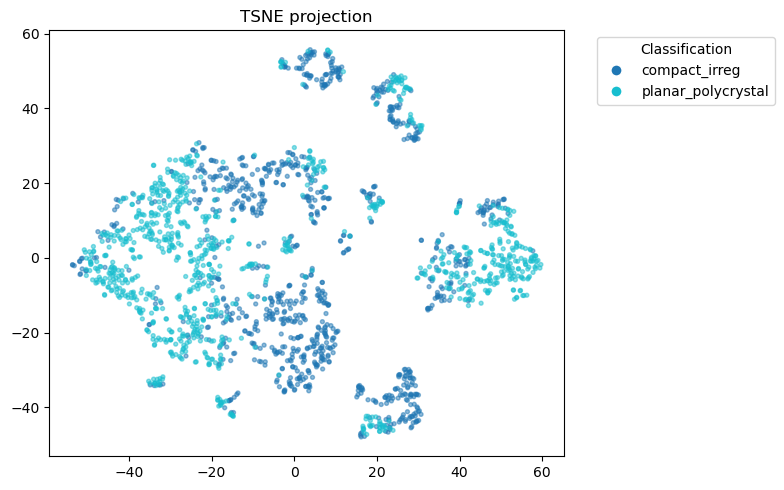

In [79]:
# Plotting
fig, ax = plt.subplots(figsize=(8, 5))
scatter = ax.scatter(X_tsne[:, 0], X_tsne[:, 1], s=8, alpha=0.5, c=labels_int, cmap='tab10')
ax.set_title('TSNE projection')

# Get the color for each class from the scatter plot
colors = scatter.cmap(scatter.norm(list(class_to_int.values())))

handles = [
    plt.Line2D([0], [0], marker='o', color='w', label=cls,
               markerfacecolor=colors[class_to_int[cls]], markersize=8)
    for cls in classes
]
ax.legend(handles=handles, title='Classification', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [80]:
# PCA with 10 PC's
emb_cols = [str(i) for i in range(384)]
X = df_balanced[emb_cols]
X_scaled = StandardScaler().fit_transform(X)
n_components = 10

# PCA
pca_model = PCA(n_components=n_components, random_state=42)
X_pca = pca_model.fit_transform(X_scaled)

# X_pca now contains the first 10 principal components for each sample
print("PCA shape:", X_pca.shape)
print("Explained variance ratio:", pca_model.explained_variance_ratio_)

PCA shape: (2000, 10)
Explained variance ratio: [0.0746736  0.04733309 0.04530827 0.03710963 0.03451598 0.03034914
 0.0276023  0.02611386 0.02554273 0.02420962]


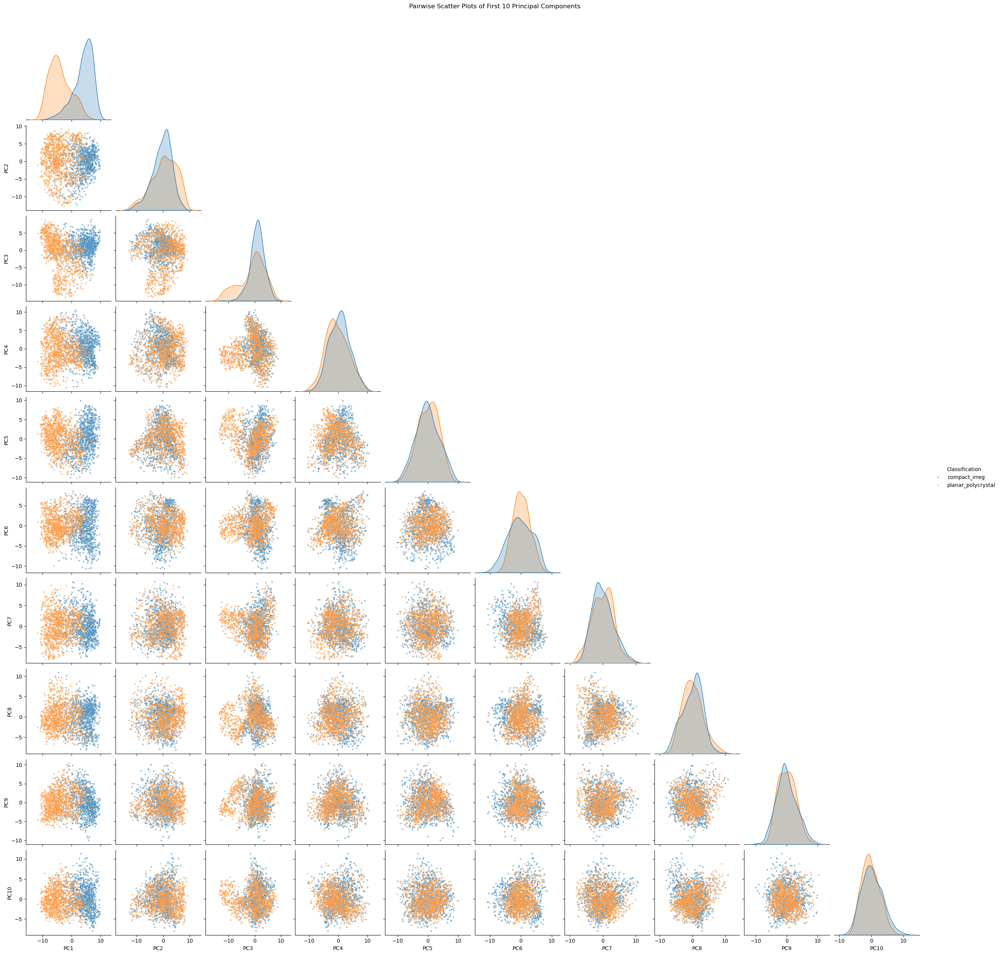

In [81]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assume X_pca is your PCA result (shape: [n_samples, 10])
# and df_balanced['Classification'] is your label

# Create a DataFrame for plotting
pc_cols = [f'PC{i+1}' for i in range(10)]
df_pca = pd.DataFrame(X_pca, columns=pc_cols)
df_pca['Classification'] = df_balanced['Classification'].values

# Plot pairplot (corner plot)
sns.pairplot(df_pca, hue='Classification', corner=True, plot_kws={'alpha':0.5, 's':10})
plt.suptitle("Pairwise Scatter Plots of First 10 Principal Components", y=1.02)
plt.show()

/home/jko/miniconda3/envs/torch/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



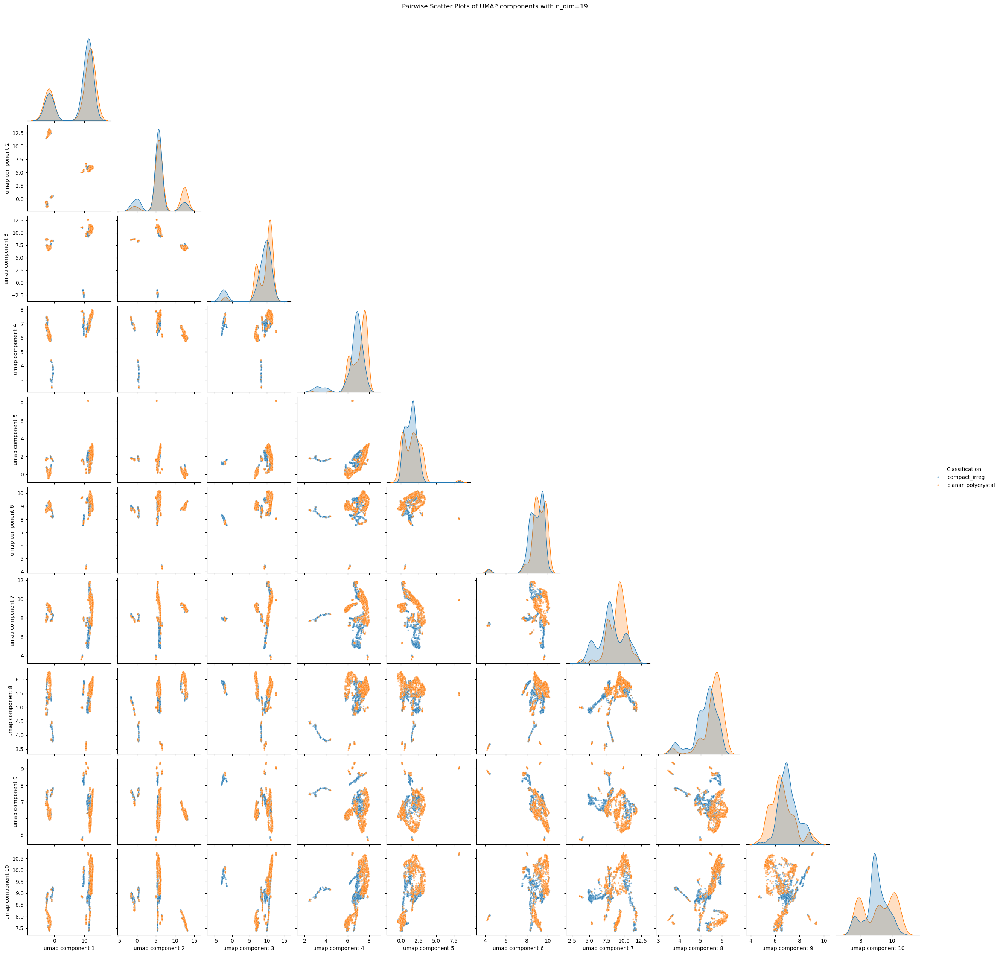

In [82]:
# do the same as above but use UMAP with 10 components 
# plot N from each class=
emb_cols = [str(i) for i in range(384)]
X = df_balanced[emb_cols]
X_scaled = StandardScaler().fit_transform(X)
# X_scaled = MinMaxScaler().fit_transform(X)
n_components = 10

# UMAP
umap_model = umap.UMAP(n_components=n_components, random_state=42)
X_umap = umap_model.fit_transform(X_scaled)
# X_umap = umap_model.fit_transform(X)

# Map string labels to integers
labels = df_balanced['Classification']
classes = labels.unique()
class_to_int = {cls: i for i, cls in enumerate(classes)}
labels_int = labels.map(class_to_int)

# X_umap is your UMAP result (shape: [n_samples, 10])
# df_balanced['Classification'] is your label

# Create a DataFrame for plotting
comp_cols = [f'umap component {i+1}' for i in range(10)]
df_umap = pd.DataFrame(X_umap, columns=comp_cols)
df_umap['Classification'] = df_balanced['Classification'].values

# Plot pairplot (corner plot)
sns.pairplot(df_umap, hue='Classification', corner=True, plot_kws={'alpha':0.5, 's':10})
plt.suptitle("Pairwise Scatter Plots of UMAP components with n_dim=19", y=1.02)
plt.show()

In [49]:
# how many of each habit? 
df_merged['Classification'].value_counts()

Classification
compact_irreg         306609
agg                   104203
rimed                  40383
planar_polycrystal     31838
budding                17117
bullet                 12520
column                 11363
Name: count, dtype: int64

In [50]:
# Test: binary classifier (agg vs. rimed)

# get a balanced subset
samples_per_class = 10000
dfs = []
habit_classes = ['agg', 'rimed']
for cls in habit_classes:
    df_cls = df_merged[df_merged['Classification'] == cls].sample(n=samples_per_class, random_state=42)
    dfs.append(df_cls)
df_agg_rimed = pd.concat(dfs).reset_index(drop=True)

In [54]:
# Select features and target
emb_cols = [str(i) for i in range(384)]
X = df_agg_rimed[emb_cols]
y = df_agg_rimed['Classification']

# Encode target labels as integers
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Split into train/test
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.1, random_state=42, stratify=y_encoded
)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train logistic regression
clf = LogisticRegression(max_iter=1000, random_state=42)
clf.fit(X_train_scaled, y_train)

# Predict and evaluate
y_pred = clf.predict(X_test_scaled)
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred, target_names=le.classes_))

Accuracy: 0.8625
              precision    recall  f1-score   support

         agg       0.87      0.85      0.86      1000
       rimed       0.85      0.87      0.86      1000

    accuracy                           0.86      2000
   macro avg       0.86      0.86      0.86      2000
weighted avg       0.86      0.86      0.86      2000



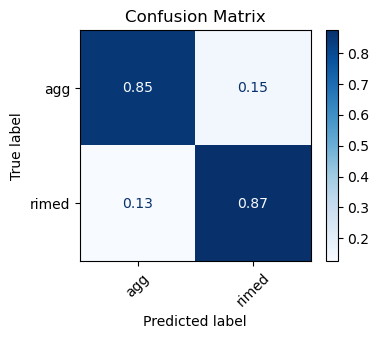

In [59]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Assuming you have y_test (true labels) and y_pred (predicted labels)
# and you used LabelEncoder for your classes as in previous examples

cm = confusion_matrix(y_test, y_pred, normalize='true')
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=le.classes_)

fig, ax = plt.subplots(figsize=(4, 3))
disp.plot(ax=ax, cmap='Blues', xticks_rotation=45)
plt.title("Confusion Matrix")
plt.show()

In [13]:
emb_cols = [str(i) for i in range(384)]
X = df_balanced[emb_cols]
X_scaled = StandardScaler().fit_transform(X)
n_components = 3

# UMAP
umap_model = umap.UMAP(n_components=n_components, random_state=42)
X_umap = umap_model.fit_transform(X_scaled)

# Map string labels to integers
labels = df_balanced['Classification']
classes = labels.unique()
class_to_int = {cls: i for i, cls in enumerate(classes)}
labels_int = labels.map(class_to_int)


/home/jko/miniconda3/envs/torch/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [16]:
# Prepare DataFrame for Plotly
labels = df_balanced['Classification']
df_plot = pd.DataFrame({
    'x': X_umap[:, 0],
    'y': X_umap[:, 1],
    'z': X_umap[:, 2],
    'Classification': labels
})

fig = px.scatter_3d(
    df_plot, x='x', y='y', z='z',
    color='Classification',
    symbol='Classification',
    title='Interactive 3D UMAP projection (Plotly)',
    opacity=1.0
)
fig.update_traces(marker=dict(size=3))  # Set marker size to 3 (smaller)
fig.show()

Trying t-SNE

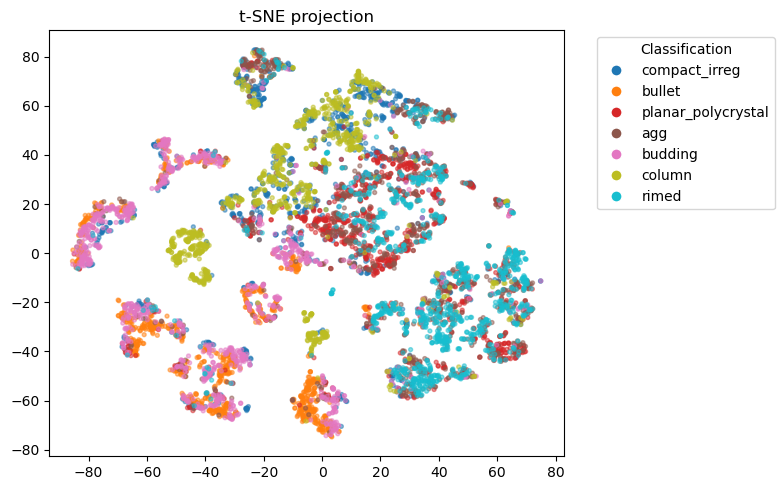

In [30]:
emb_cols = list(range(384))
X = df_balanced[emb_cols]
X_scaled = StandardScaler().fit_transform(X)
n_components = 2

# t-SNE
tsne_model = TSNE(n_components=n_components, random_state=42)
X_tsne = tsne_model.fit_transform(X_scaled)

# Map string labels to integers
labels = df_balanced['Classification']
classes = labels.unique()
class_to_int = {cls: i for i, cls in enumerate(classes)}
labels_int = labels.map(class_to_int)

# Plotting
fig, ax = plt.subplots(figsize=(8, 5))
scatter = ax.scatter(X_tsne[:, 0], X_tsne[:, 1], s=8, alpha=0.5, c=labels_int, cmap='tab10')
ax.set_title('t-SNE projection')

# Get the color for each class from the scatter plot
colors = scatter.cmap(scatter.norm(list(class_to_int.values())))

handles = [
    plt.Line2D([0], [0], marker='o', color='w', label=cls,
               markerfacecolor=colors[class_to_int[cls]], markersize=8)
    for cls in classes
]
ax.legend(handles=handles, title='Classification', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [ ]:
emb_cols = list(range(384))
X = df_balanced[emb_cols]
X_scaled = StandardScaler().fit_transform(X)
n_components = 3

# t-SNE
tsne_model = TSNE(n_components=n_components, random_state=42)
X_tsne = tsne_model.fit_transform(X_scaled)

In [34]:
# Prepare DataFrame for Plotly
labels = df_balanced['Classification']
df_plot = pd.DataFrame({
    'x': X_tsne[:, 0],
    'y': X_tsne[:, 1],
    'z': X_tsne[:, 2],
    'Classification': labels
})

fig = px.scatter_3d(
    df_plot, x='x', y='y', z='z',
    color='Classification',
    symbol='Classification',
    title='Interactive 3D t-SNE projection (Plotly)',
    opacity=1.0
)
fig.update_traces(marker=dict(size=3))  # Set marker size to 3 (smaller)
fig.show()